## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator` and set it to `GPU`.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls '/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/'

In [ ]:
# # only if uft-8 error occurs
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
import multiprocessing

cores = multiprocessing.cpu_count() # Count the number of cores in a computer
cores

8

In [ ]:
!nvidia-smi

Fri Jan 19 08:33:18 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   71C    P0              32W /  70W |   4827MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

## Install Detectron2 and dependencies

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-fz9f1syk
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-fz9f1syk
  Resolved https://github.com/facebookresearch/detectron2.git to commit 864913f0e57e87a75c8cc0c7d79ecbd774fc669b
  Preparing metadata (setup.py) ... done


Now is a good time to confirm that we have the right versions of the libraries at our disposal.

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


In [ ]:
# COMMON LIBRARIES
import os
import cv2
import json
import numpy as np

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import build_detection_test_loader
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import hooks

# TRAINING
from detectron2.engine import DefaultTrainer

## COCO Format Dataset

### Download from Drive

Structure of your dataset should look like this:

```
content/drive/My Drive/dataset-directory/

├─ train
│  ├─ train-image-1.jpg
│  ├─ train-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
├─ test
│  ├─ test-image-1.jpg
│  ├─ test-image-1.jpg
│  ├─ ...
│  └─ _annotations.coco.json
└─ valid
   ├─ valid-image-1.jpg
   ├─ valid-image-1.jpg
   ├─ ...
   └─ _annotations.coco.json
```

### Registration

In [ ]:
# from detectron2.data.datasets import register_coco_instances
register_coco_instances("train", {},"/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/train/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/train/")
register_coco_instances("val", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/val/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/val/")
register_coco_instances("test_0", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_0/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_0/")
register_coco_instances("test_1", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_1/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_1/")
register_coco_instances("test_2", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_2/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_2/")
register_coco_instances("test_3", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_3/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_3/")
register_coco_instances("test_4", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/")
register_coco_instances("test_full", {}, "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_full/_annotations.coco.json", "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_full/")

In [ ]:
train_metadata = MetadataCatalog.get("train")
val_metadata = MetadataCatalog.get("val")

test_0_metadata = MetadataCatalog.get("test_0")
test_1_metadata = MetadataCatalog.get("test_1")
test_2_metadata = MetadataCatalog.get("test_2")
test_3_metadata = MetadataCatalog.get("test_3")
test_4_metadata = MetadataCatalog.get("test_4")
test_full_metadata = MetadataCatalog.get("test_full")

In [ ]:
val_metadata

namespace(name='val',
          json_file='/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/val/_annotations.coco.json',
          image_root='/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/val/',
          evaluator_type='coco',
          thing_classes=['waste-VXnl',
                         'cardboard',
                         'hard_plastic',
                         'metal',
                         'soft_plastic'],
          thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2, 3: 3, 4: 4})

In [ ]:
test_4_metadata

namespace(name='test_4',
          json_file='/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/_annotations.coco.json',
          image_root='/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/',
          evaluator_type='coco')

### image visualisation

WARNING [01/18 13:35:09 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/18 13:35:09 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/_annotations.coco.json


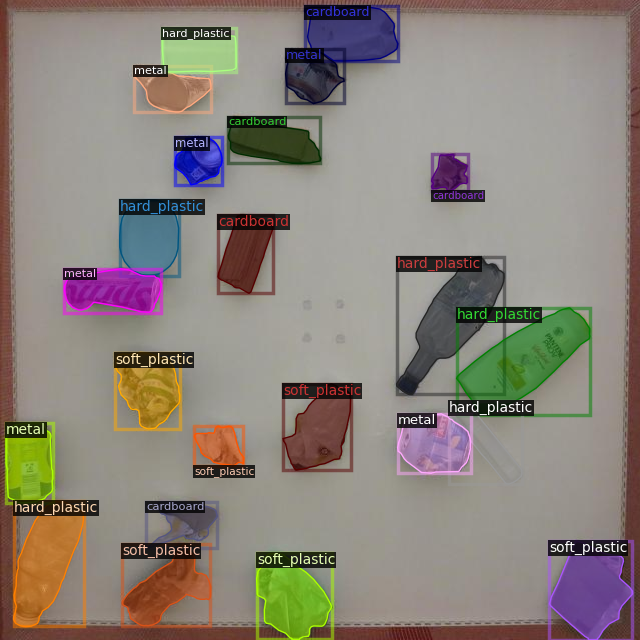

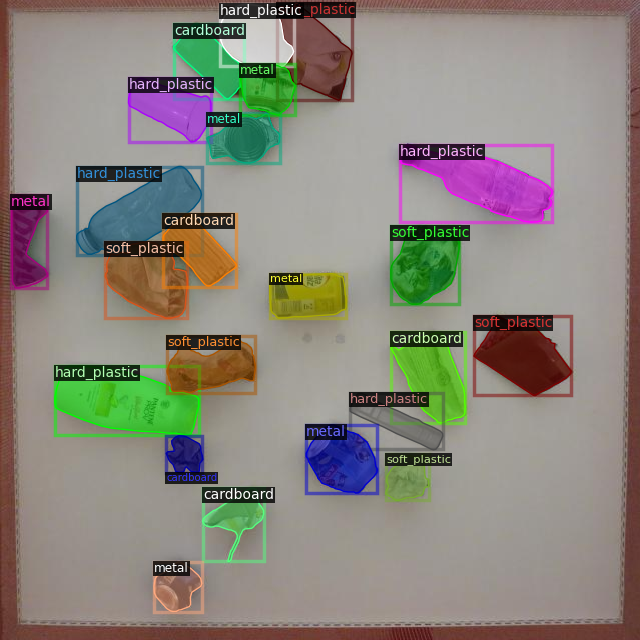

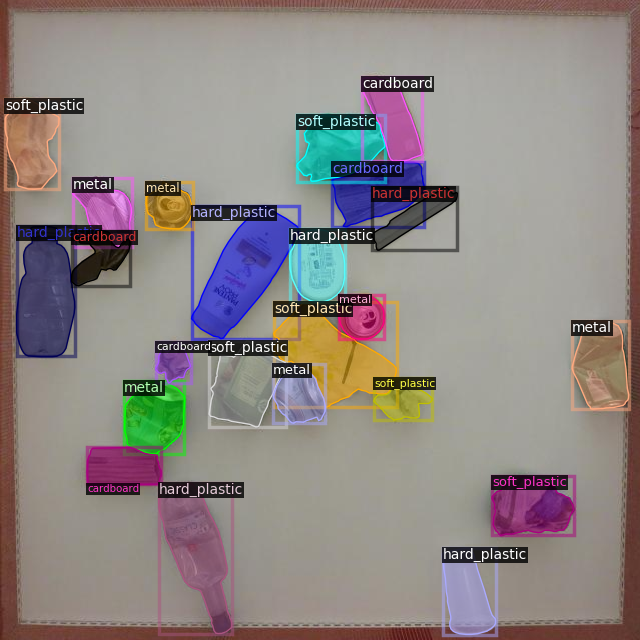

In [ ]:
# Visualize specific images based on indexes
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow  # For displaying images in Colab

specific_indices = [5,12,16]  # Change these to the desired indices

# Get the test dataset
my_dataset_train_metadata = MetadataCatalog.get("test_4")
dataset_dicts = DatasetCatalog.get("test_4")

# Access the specific images
specific_images = [dataset_dicts[index] for index in specific_indices]

# Read the images and run visualization
for specific_image in specific_images:
    img = cv2.imread(specific_image["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(specific_image)
    cv2_imshow(vis.get_image()[:, :, ::-1])


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



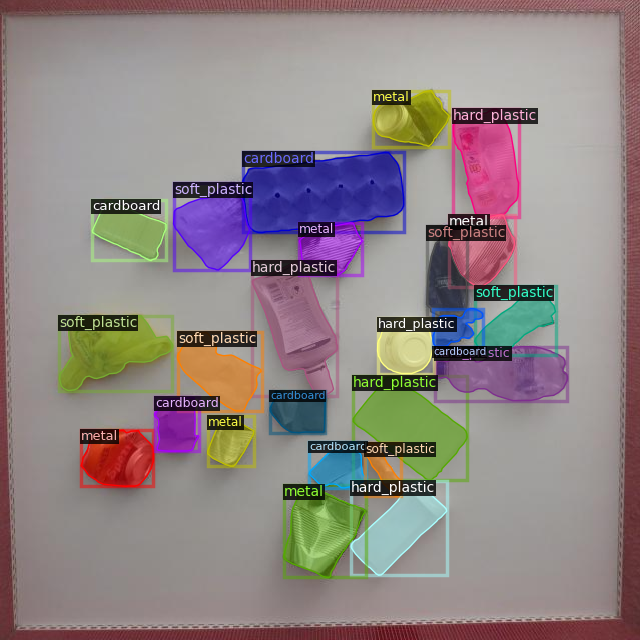

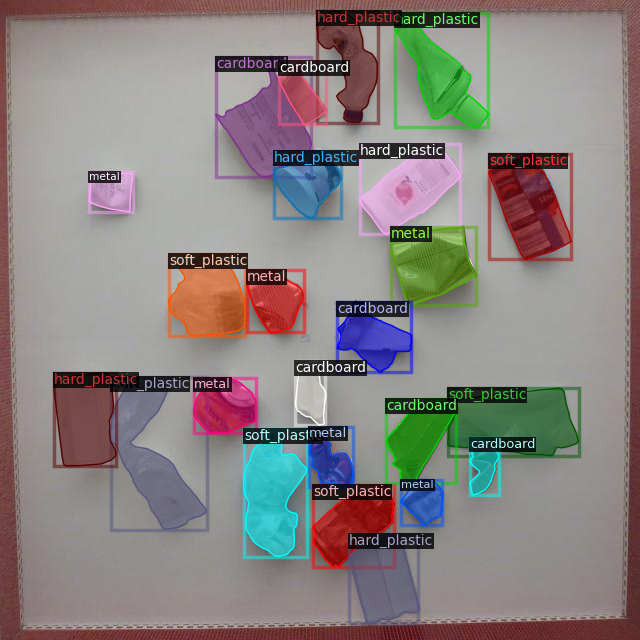

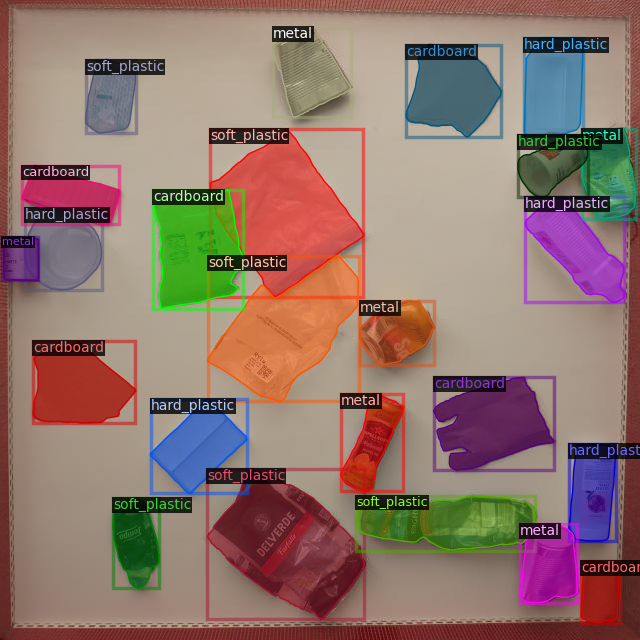

In [ ]:
# Visualize random images from val dataset
my_dataset_train_metadata = MetadataCatalog.get("val")
dataset_dicts = DatasetCatalog.get("val")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=1)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## Train Model Using Custom COCO Format Dataset

In [ ]:
#@title Default Validation evaluator

# Set up configuration
cfg = get_cfg()
cfg.OUTPUT_DIR = '/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240118_mask_rcnn_R_101_FPN_3x/train_2000'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
# ARCHITECTURE = "mask_rcnn_R_50_FPN_1x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"

# Merge configuration from file and set model weights
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)

# Specify datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("val",) # here just the dataset that should be evaluated during training should be specified

# Set other training parameters
cfg.INPUT.MIN_SIZE_TRAIN = cfg.INPUT.MAX_SIZE_TRAIN = 640
cfg.INPUT.MIN_SIZE_TEST = cfg.INPUT.MAX_SIZE_TEST = 640

cfg.SOLVER.IMS_PER_BATCH = 8   # increase this for more speed, but it will need more vram
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 2000  # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.TEST.EVAL_PERIOD = 500

# Disable Augmentations:
#cfg.INPUT.RANDOM_FLIP = "none"  # Disable random horizontal flip
#cfg.INPUT.ROTATION_RANGE = 0  # Disable random rotation
#cfg.INPUT.BRIGHTNESS_RANGE = [1, 1]  # Disable random brightness scaling
#cfg.INPUT.CONTRAST_RANGE = [1, 1]  # Disable random contrast scaling
#cfg.INPUT.SATURATION_RANGE = [1, 1]  # Disable random saturation scaling
#cfg.INPUT.CROP.TYPE = "relative_range"  # Disable random cropping
#cfg.INPUT.CROP.SIZE = [1, 1]  # Disable random cropping
#cfg.TEST.AUG = "none" # prevent rezisuing the val images
#cfg.INPUT.COLOR_TRANSFORM = 0.0 # Applies color transformations to the image.

# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 4096   # or 128 for example
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # number of classes plus background (x + 1)
# cfg.SNAPSHOT_ITERS = 50 # when checkpoint gets created
cfg.SOLVER.CHECKPOINT_PERIOD = 500
# cfg.INPUT.MASK_FORMAT='bitmask'
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.DATALOADER.NUM_WORKERS = 2

cfg.SAVE_PERIOD = 500  # set the save period, e.g., every 500 iterations

# Initialize the trainer
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

# Add an evaluation hook
evaluator = COCOEvaluator("val", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "val")

# New method to add the hook in Detectron2
trainer.register_hooks([hooks.EvalHook(cfg.TEST.EVAL_PERIOD, lambda: evaluator.evaluate(inference_on_dataset(trainer.model, val_loader, evaluator)))])

# Just need to call: trainer.train()
# trainer.train()

In [ ]:
#@title Default Validation evaluator

# Set up configuration
cfg = get_cfg()
cfg.OUTPUT_DIR = '/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240119_mask_rcnn_R_50_FPN_1x/train_1800'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

ARCHITECTURE = "mask_rcnn_R_50_FPN_1x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"

# Merge configuration from file and set model weights
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)

# Specify datasets
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ("val",) # here just the dataset that should be evaluated during training should be specified

# Set other training parameters
cfg.INPUT.MIN_SIZE_TRAIN = cfg.INPUT.MAX_SIZE_TRAIN = 640
cfg.INPUT.MIN_SIZE_TEST = cfg.INPUT.MAX_SIZE_TEST = 640

cfg.SOLVER.IMS_PER_BATCH = 8   # increase this for more speed, but it will need more vram
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 1800   # iterations seems good enough for this dataset
cfg.TEST.EVAL_PERIOD = 500

# Disable Augmentations:
#cfg.INPUT.RANDOM_FLIP = "none"  # Disable random horizontal flip
#cfg.INPUT.ROTATION_RANGE = 0  # Disable random rotation
#cfg.INPUT.BRIGHTNESS_RANGE = [1, 1]  # Disable random brightness scaling
#cfg.INPUT.CONTRAST_RANGE = [1, 1]  # Disable random contrast scaling
#cfg.INPUT.SATURATION_RANGE = [1, 1]  # Disable random saturation scaling
#cfg.INPUT.CROP.TYPE = "relative_range"  # Disable random cropping
#cfg.INPUT.CROP.SIZE = [1, 1]  # Disable random cropping
#cfg.TEST.AUG = "none" # prevent rezisuing the val images
#cfg.INPUT.COLOR_TRANSFORM = 0.0 # Applies color transformations to the image.

# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 4096   # or 128 for example
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5  # number of classes plus background (x + 1)
# cfg.SNAPSHOT_ITERS = 50 # when checkpoint gets created
cfg.SOLVER.CHECKPOINT_PERIOD = 900
# cfg.INPUT.MASK_FORMAT='bitmask'
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.DATALOADER.NUM_WORKERS = 2

cfg.SAVE_PERIOD = 900  # set the save period, e.g., every 500 iterations

### Training

In [ ]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[01/19 08:36:50 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_a54504.pkl: 178MB [00:01, 165MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[01/19 08:36:57 d2.engine.train_loop]: Starting training from iteration 0
[01/19 08:38:12 d2.utils.events]:  eta: 1:46:15  iter: 19  total_loss: 3.573  loss_cls: 1.599  loss_box_reg: 0.8367  loss_mask: 0.6935  loss_rpn_cls: 0.3438  loss_rpn_loc: 0.09551    time: 3.6140  last_time: 3.5899  data_time: 2.0187  last_data_time: 1.8685   lr: 4.9953e-06  max_mem: 6516M
[01/19 08:39:27 d2.utils.events]:  eta: 1:44:39  iter: 39  total_loss: 3.435  loss_cls: 1.523  loss_box_reg: 0.8401  loss_mask: 0.6908  loss_rpn_cls: 0.2873  loss_rpn_loc: 0.09443    time: 3.6227  last_time: 3.4326  data_time: 1.9120  last_data_time: 1.7517   lr: 9.9902e-06  max_mem: 6516M
[01/19 08:40:38 d2.utils.events]:  eta: 1:43:12  iter: 59  total_loss: 3.204  loss_cls: 1.39  loss_box_reg: 0.8393  loss_mask: 0.6849  loss_rpn_cls: 0.2001  loss_rpn_loc: 0.09183    time: 3.5974  last_time: 3.5558  data_time: 1.8495  last_data_time: 1.8399   lr: 1.4985e-05  max_mem: 6516M
[01/19 08:41:50 d2.utils.events]:  eta: 1:42:07  iter:

### Activate Tensorboard

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240119_mask_rcnn_R_50_FPN_1x/train_1800" # $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

### Evaluation when tarining was made direktly before


In [ ]:
 cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
 cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
 predictor = DefaultPredictor(cfg)

[01/18 15:07:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240118_mask_rcnn_R_50_FPN_1x/train_1800-2000/model_final.pth ...


In [ ]:
#@title AP metric validationset
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val", cfg, False) #, output_dir="/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240119_mask_rcnn_R_50_FPN_1x/train_1800/test_4_results")
val_loader = build_detection_test_loader(cfg, "val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

In [ ]:
#@title AP metric for test_0
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("test_0", cfg, False, output_dir="/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/20240117_mask_rcnn_R_50_FPN_1x/test_old_version_1/test_0")
val_loader = build_detection_test_loader(cfg, "test_0")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [01/17 14:05:56 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [01/17 14:05:56 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/17 14:05:56 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_0/_annotations.coco.json
[01/17 14:05:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(640, 640), max_size=640, sample_style='choice')]
[01/17 14:05:56 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[01/17 14:05:56 d2.data.common]: Serializing 20 elements to byte tensors and concatenating them all ...
[01/17 14:05:56 d2.data.common]: Serialized dataset takes 0.29 MiB
[01/17 14:05:56 d2.evaluation.evaluator]: Start inferen

OrderedDict([('bbox',
              {'AP': 9.714414324095982,
               'AP50': 19.266156558930767,
               'AP75': 8.762259265030647,
               'APs': 0.6930693069306931,
               'APm': 10.988907698320478,
               'APl': 10.469788714744753,
               'AP-waste-eM5S': nan,
               'AP-cardboard': 2.7526250648500974,
               'AP-hard_plastic': 9.53188316469117,
               'AP-metal': 17.60328768332222,
               'AP-soft_plastic': 8.969861383520444}),
             ('segm',
              {'AP': 9.445210753211644,
               'AP50': 18.340741945761742,
               'AP75': 9.476803877909848,
               'APs': 0.2952616690240452,
               'APm': 10.162406866937404,
               'APl': 13.800822048969277,
               'AP-waste-eM5S': nan,
               'AP-cardboard': 2.4583701999241114,
               'AP-hard_plastic': 8.106797559580384,
               'AP-metal': 17.2855861883597,
               'AP-soft_pla

In [ ]:
#@title AP metric for test_4
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("test_4", cfg, False, output_dir="/content/drive/My Drive/enhanced_waste_segmentation_Detectron2/output/mask_rcnn_X_101_32x8d_FPN_3x/max_iter_5000/test_4_conf_0.5")
val_loader = build_detection_test_loader(cfg, "test_4")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [12/19 13:02:20 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [12/19 13:02:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/19 13:02:20 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/_annotations.coco.json
[12/19 13:02:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/19 13:02:20 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/19 13:02:20 d2.data.common]: Serializing 20 elements to byte tensors and concatenating them all ...
[12/19 13:02:20 d2.data.common]: Serialized dataset takes 0.33 MiB
[12/19 13:02:20 d2.evaluation.evaluator]: Start infere

OrderedDict([('bbox',
              {'AP': 61.97206916487465,
               'AP50': 76.20480273118694,
               'AP75': 68.8752387507015,
               'APs': 10.0,
               'APm': 63.15730419629427,
               'APl': 55.02215730416001,
               'AP-waste-pp7T': nan,
               'AP-cardboard': 70.67080826650903,
               'AP-hard_plastic': 66.21948364420295,
               'AP-metal': 66.647290150806,
               'AP-soft_plastic': 44.35069459798064}),
             ('segm',
              {'AP': 62.219249736778224,
               'AP50': 76.88043464770762,
               'AP75': 68.7532913971034,
               'APs': 10.0,
               'APm': 62.619660060870885,
               'APl': 55.84617606364031,
               'AP-waste-pp7T': nan,
               'AP-cardboard': 70.00240425875674,
               'AP-hard_plastic': 63.540323431211185,
               'AP-metal': 69.36145065721871,
               'AP-soft_plastic': 45.97282059992628})])

WARNING [01/19 10:19:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/19 10:19:17 d2.data.datasets.coco]: Loaded 20 images in COCO format from /content/drive/My Drive/enhanced_waste_segmentation_Detectron2/test_4/_annotations.coco.json


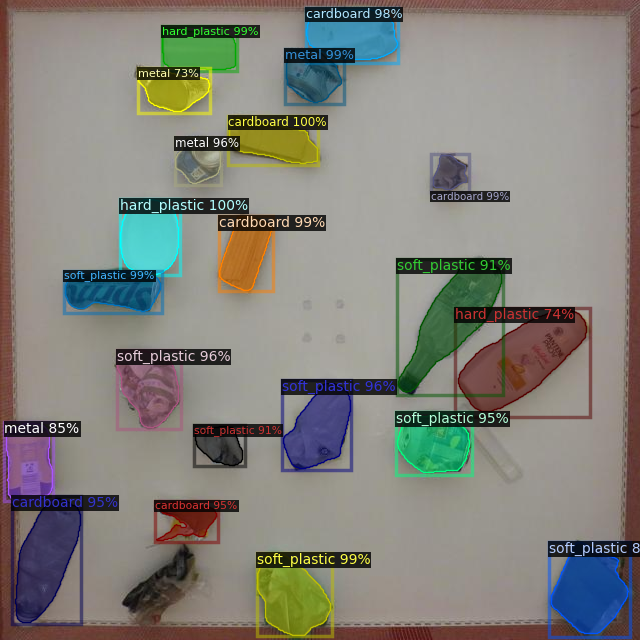

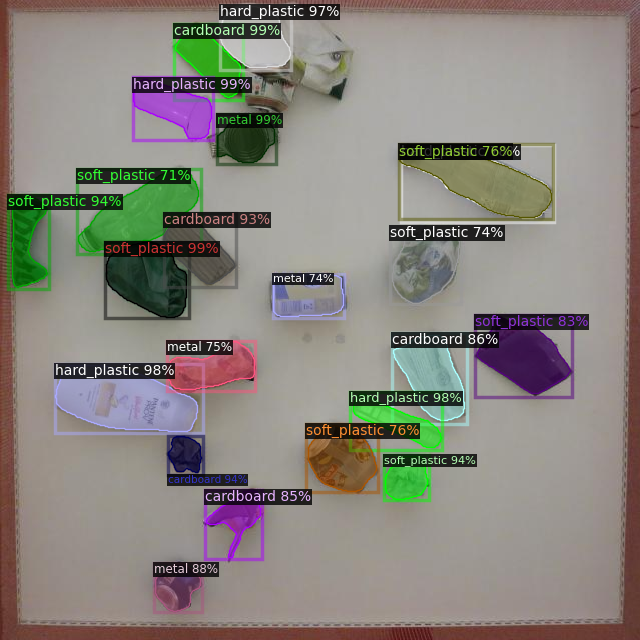

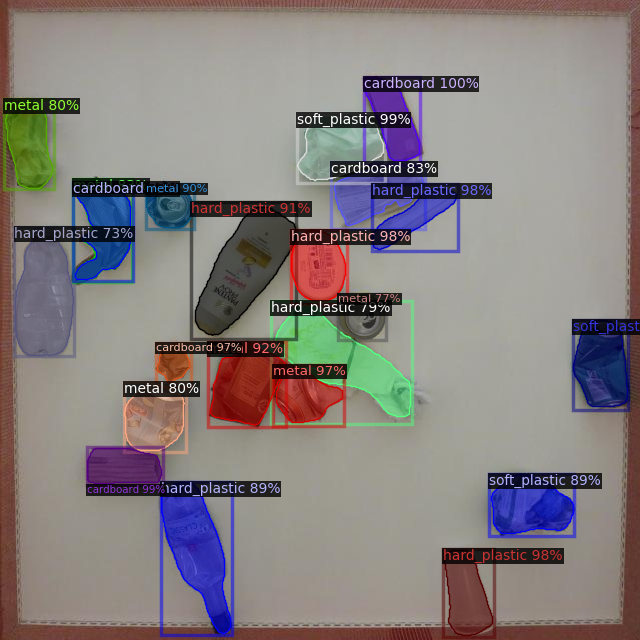

In [ ]:
#@title Visualize just one specific test image
import cv2
from detectron2.utils.visualizer import Visualizer
from google.colab.patches import cv2_imshow  # For displaying images in Colab

# Choose specific indices
specific_indices = [5,12,16]  # Change these to the desired indices # good examples 1or 5, 12, 16

# Get the dataset
dataset_dicts = DatasetCatalog.get("test_4")

# Access the specific images
specific_images = [dataset_dicts[index] for index in specific_indices]

# Read the images and run inference
for specific_image in specific_images:
    im = cv2.imread(specific_image["file_name"])
    outputs = predictor(im)

    # Visualize the results
    v = Visualizer(im[:, :, ::-1], metadata=test_4_metadata, scale=1)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])
